# Simulation | [44,-23] Free-Free | FoV4

In [3]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_44_23_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_44_23_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_44_23_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_44_23_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [4]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [5]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [6]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gfree_simmap()

0.8915359377861023
0.8980929162353277
0.22892330400645733
0.21442255191504955


In [7]:
SF4_fitmap, SF2_fitmap = load_Gfree_fitmap()

0.046278538182377815
0.165774529799819


#### Set-up gss-map

In [8]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [9]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV4x4

In [10]:
Sfov4 = GalacticDev( comp='Gfree', nside=32768, use_G02=True, extra_large_mode=True, center=( 44,-23 ), grfmap=fov4grf, grfpatch=True, fov = ( 4, 4 ), sim_pixel = 2, default=True )

2022-08-13 15:16:36,626 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 15:16:36,628 : createlog : INFO : Log standard output streaming is False
2022-08-13 15:16:36,629 : createlog : INFO : GSim_Gfree_Default_True_08_13_2022_151636.log log file is created
2022-08-13 15:16:36,630 : createlog : INFO : Log is created by cxshan
2022-08-13 15:16:36,631 : createlog : INFO : Log level is debug
2022-08-13 15:16:36,632 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 15:16:36,632 : __init__ : INFO :  Galactic Gfree simulation is initializing! 
2022-08-13 15:16:36,633 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 15:16:36,634 : _set_comp : INFO : compID is galactic/freefree, name is Galactic free-free
2022-08-13 15:16:36,635 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 15:16:36,636 : _set_default_params : INFO :  Default settings ar

 Please update the healpix maps when you need to. 


In [11]:
S = Sfov4

In [12]:
S.filename_pattern = '{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [13]:
S.filename_pattern

'{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [14]:
s_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4'
s_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4'
s_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4'

In [15]:
S.set_gamma(-2.42645582)

2022-08-13 15:16:37,750 : set_gamma : INFO :  gamma is set as -2.42645582 


In [16]:
S.set_alpha(0.028225957060665583)
S.set_beta(0.5723354608928948)

2022-08-13 15:16:37,775 : set_alpha : INFO :  alpha is set as 0.028225957060665583 
2022-08-13 15:16:37,776 : set_beta : INFO :  beta is set as 0.5723354608928948 


#### Set up frequency simulation

In [17]:
S._set_up_freq()

2022-08-13 15:16:37,785 : gen_simmap : INFO : Using mask filled map to generate simulation image.
2022-08-13 15:19:11,015 : gen_simmap : INFO :  Finish generating the original image for simulation, using 153.22911367751658 s.
2022-08-13 15:19:11,019 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 15:19:13,363 : _set_physical_params : INFO :  Physical params are set. 


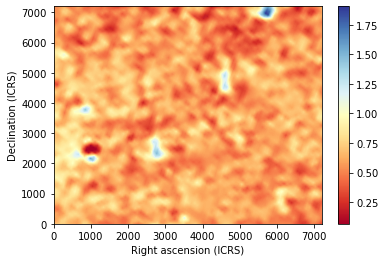

In [18]:
S.viewslice(S.patch_map)

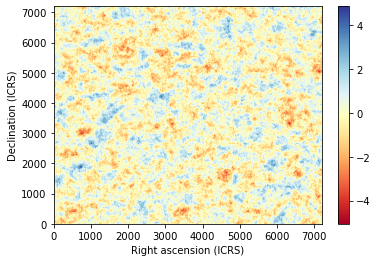

In [19]:
S.viewslice(S.patch_gss)

In [20]:
smoothed_input_map = S.smooth_sky(0.4, S.skypatch)

2022-08-13 15:19:35,221 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7befd650> with a Gaussian filter ...
2022-08-13 15:20:11,899 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 72.00 [pixel]


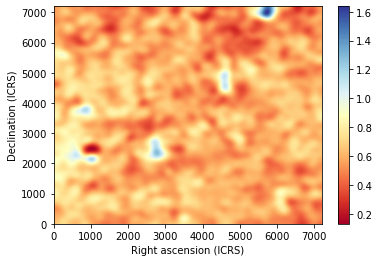

In [21]:
S.viewslice(smoothed_input_map)

In [22]:
S.skypatch.data = smoothed_input_map

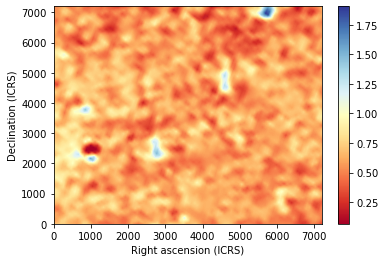

In [23]:
S.viewslice(S.patch_map)

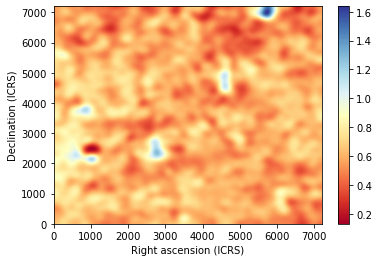

In [24]:
S.viewslice(S.skypatch.data)

### Simulate one freq

In [25]:
F158 = S.simulate_frequency(158,skytype='patch')

2022-08-13 15:20:43,737 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 15:20:45,902 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:20:54,140 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


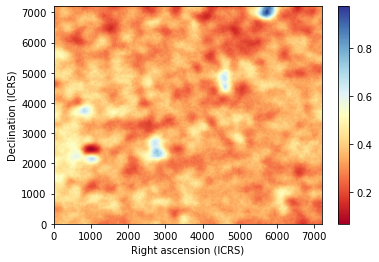

In [26]:
S.viewslice(F158.data)

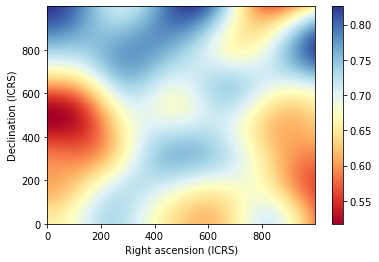

In [27]:
S.viewslice(smoothed_input_map[0:1000,0:1000])

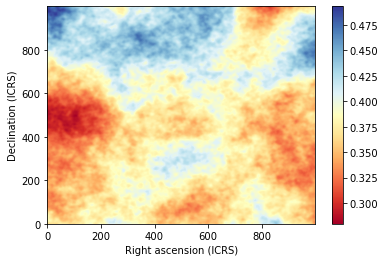

In [28]:
S.viewslice(F158.data[0:1000,0:1000])

### Simulate full freq bands

In [29]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

##### Low band

2022-08-13 15:23:24,683 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:24,685 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.00 [MHz] ...
2022-08-13 15:23:26,909 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:23:35,424 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 15:23:36,648 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.00.fits']


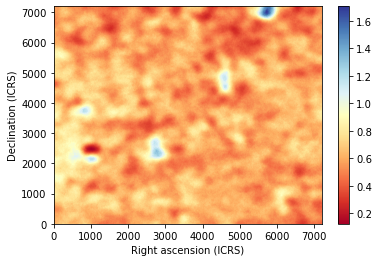

2022-08-13 15:23:40,211 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:40,214 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.16 [MHz] ...
2022-08-13 15:23:41,028 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:23:46,470 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 15:23:46,757 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.16.fits']


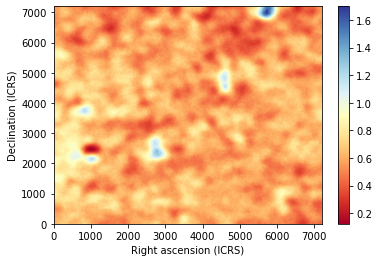

2022-08-13 15:23:48,694 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:48,697 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.32 [MHz] ...
2022-08-13 15:23:49,443 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:23:54,824 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 15:23:55,107 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.32.fits']


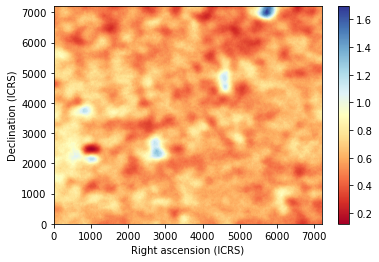

2022-08-13 15:23:57,028 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:23:57,031 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.48 [MHz] ...
2022-08-13 15:23:57,779 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:03,157 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 15:24:03,443 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.48.fits']


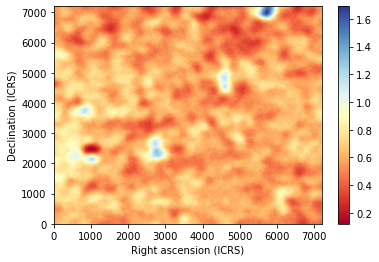

2022-08-13 15:24:05,361 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:05,364 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.64 [MHz] ...
2022-08-13 15:24:06,116 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:11,494 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 15:24:11,779 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.64.fits']


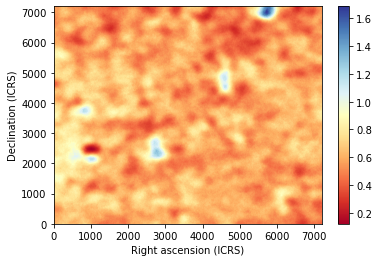

2022-08-13 15:24:13,702 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:13,705 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.80 [MHz] ...
2022-08-13 15:24:14,454 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:19,838 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 15:24:20,124 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.80.fits']


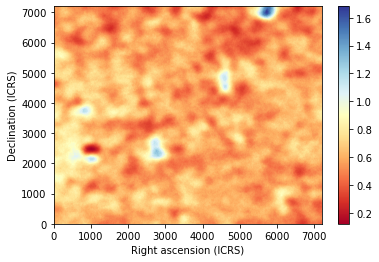

2022-08-13 15:24:22,038 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:22,040 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.96 [MHz] ...
2022-08-13 15:24:22,789 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:28,164 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 15:24:28,449 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_120.96.fits']


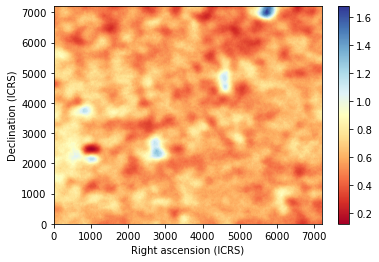

2022-08-13 15:24:30,359 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:30,362 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.12 [MHz] ...
2022-08-13 15:24:31,115 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:36,489 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 15:24:36,774 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.12.fits']


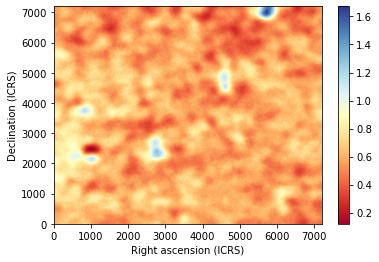

2022-08-13 15:24:38,689 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:38,692 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.28 [MHz] ...
2022-08-13 15:24:39,439 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:44,811 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 15:24:45,096 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.28.fits']


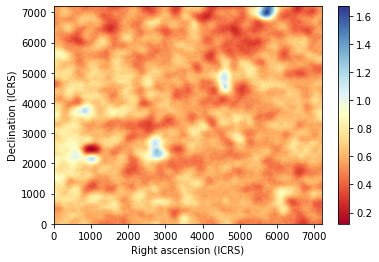

2022-08-13 15:24:47,016 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:47,019 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.44 [MHz] ...
2022-08-13 15:24:47,770 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:24:53,138 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 15:24:53,423 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.44.fits']


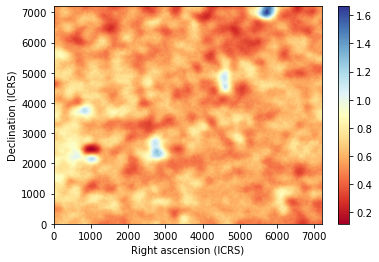

2022-08-13 15:24:55,910 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:24:55,912 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.60 [MHz] ...
2022-08-13 15:24:56,658 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:02,027 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 15:25:02,464 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.60.fits']


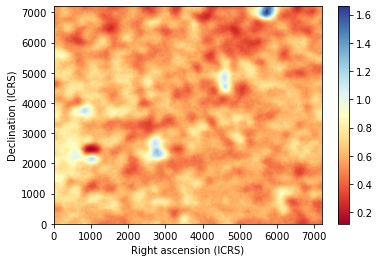

2022-08-13 15:25:04,720 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:04,723 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.76 [MHz] ...
2022-08-13 15:25:06,165 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:12,433 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 15:25:12,727 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.76.fits']


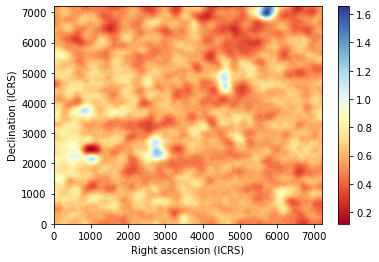

2022-08-13 15:25:14,650 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:14,653 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.92 [MHz] ...
2022-08-13 15:25:15,398 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:21,192 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 15:25:21,483 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_121.92.fits']


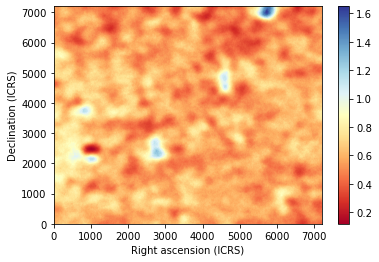

2022-08-13 15:25:23,404 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:23,407 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.08 [MHz] ...
2022-08-13 15:25:24,160 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:29,945 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 15:25:30,233 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.08.fits']


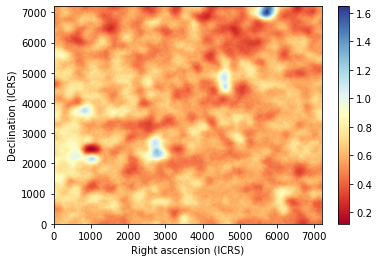

2022-08-13 15:25:32,154 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:32,157 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.24 [MHz] ...
2022-08-13 15:25:32,906 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:38,694 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 15:25:38,983 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.24.fits']


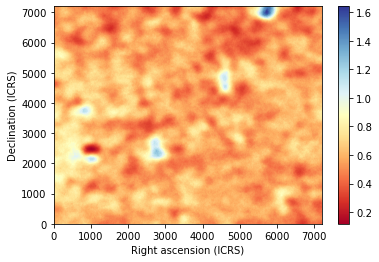

2022-08-13 15:25:40,903 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:40,906 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.40 [MHz] ...
2022-08-13 15:25:41,655 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:47,428 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 15:25:47,716 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.40.fits']


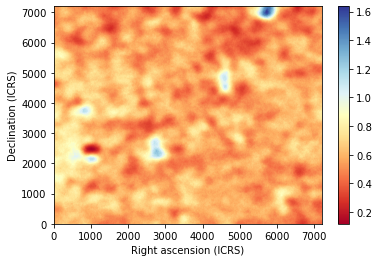

2022-08-13 15:25:49,636 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:49,639 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.56 [MHz] ...
2022-08-13 15:25:50,390 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:25:56,163 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 15:25:56,452 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.56.fits']


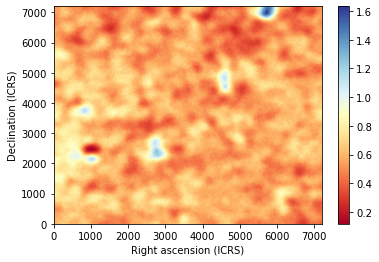

2022-08-13 15:25:58,374 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:25:58,376 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.72 [MHz] ...
2022-08-13 15:25:59,135 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:04,683 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 15:26:04,971 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.72.fits']


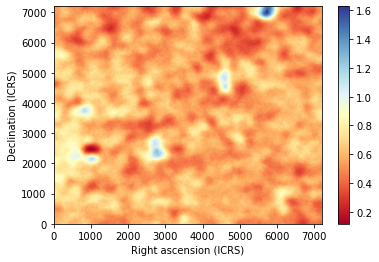

2022-08-13 15:26:06,888 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:06,891 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.88 [MHz] ...
2022-08-13 15:26:07,640 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:13,225 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 15:26:13,511 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_122.88.fits']


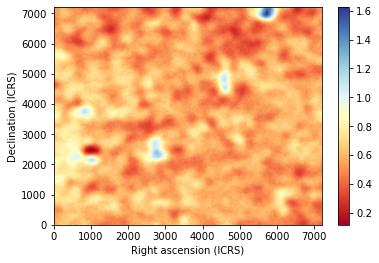

2022-08-13 15:26:15,427 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:15,430 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.04 [MHz] ...
2022-08-13 15:26:16,176 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:21,926 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 15:26:22,334 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.04.fits']


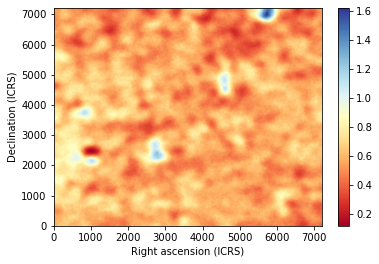

2022-08-13 15:26:24,255 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:24,258 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.20 [MHz] ...
2022-08-13 15:26:25,012 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:30,797 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 15:26:31,084 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.20.fits']


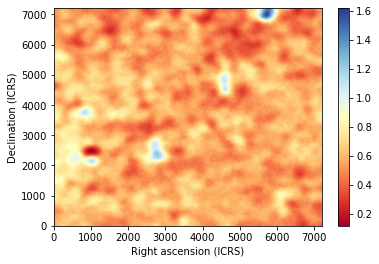

2022-08-13 15:26:33,558 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:33,561 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.36 [MHz] ...
2022-08-13 15:26:34,309 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:39,673 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 15:26:39,966 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.36.fits']


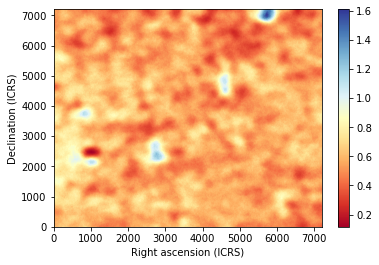

2022-08-13 15:26:41,890 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:41,893 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.52 [MHz] ...
2022-08-13 15:26:42,648 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:48,000 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 15:26:48,287 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.52.fits']


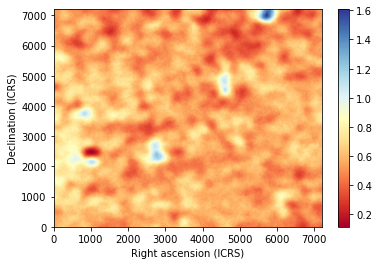

2022-08-13 15:26:50,212 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:50,215 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.68 [MHz] ...
2022-08-13 15:26:50,977 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:26:56,331 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 15:26:56,622 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.68.fits']


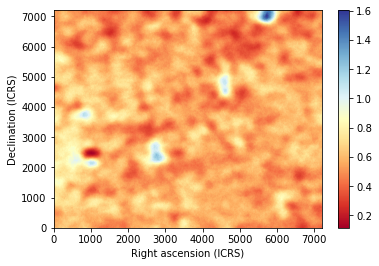

2022-08-13 15:26:58,545 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:26:58,548 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.84 [MHz] ...
2022-08-13 15:26:59,297 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:04,651 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 15:27:04,938 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_123.84.fits']


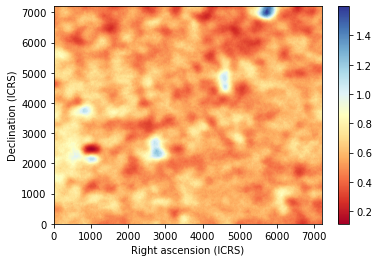

2022-08-13 15:27:06,861 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:06,864 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.00 [MHz] ...
2022-08-13 15:27:07,611 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:12,967 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 15:27:13,254 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.00.fits']


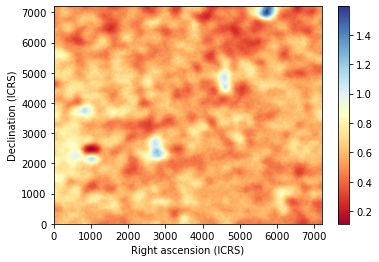

2022-08-13 15:27:15,169 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:15,172 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.16 [MHz] ...
2022-08-13 15:27:15,925 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:21,691 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 15:27:21,979 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.16.fits']


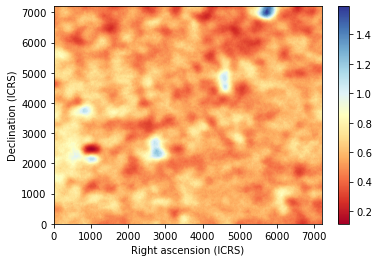

2022-08-13 15:27:23,899 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:23,902 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.32 [MHz] ...
2022-08-13 15:27:24,657 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:30,427 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 15:27:30,714 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.32.fits']


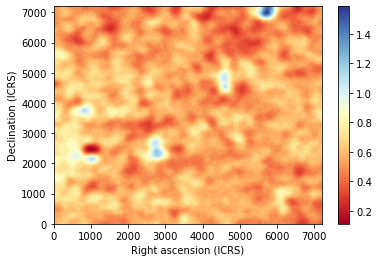

2022-08-13 15:27:32,634 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:32,637 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.48 [MHz] ...
2022-08-13 15:27:33,388 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:39,152 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 15:27:39,438 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.48.fits']


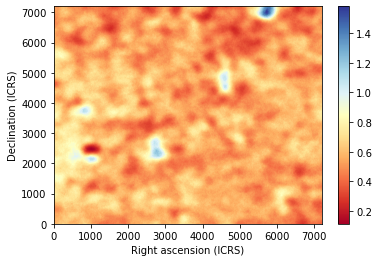

2022-08-13 15:27:41,352 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:41,354 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.64 [MHz] ...
2022-08-13 15:27:42,105 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:47,876 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 15:27:48,164 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.64.fits']


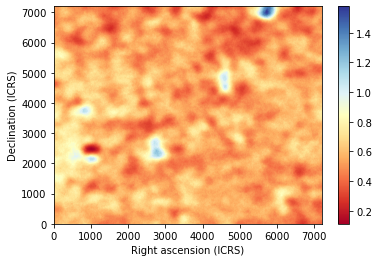

2022-08-13 15:27:50,083 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:50,086 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.80 [MHz] ...
2022-08-13 15:27:50,834 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:27:56,608 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 15:27:56,898 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.80.fits']


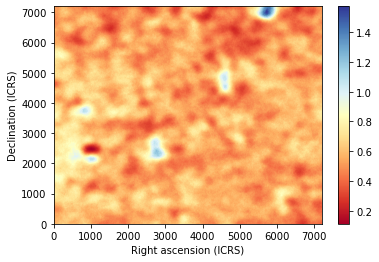

2022-08-13 15:27:58,815 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:27:58,818 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.96 [MHz] ...
2022-08-13 15:27:59,564 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:05,344 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 15:28:05,633 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_124.96.fits']


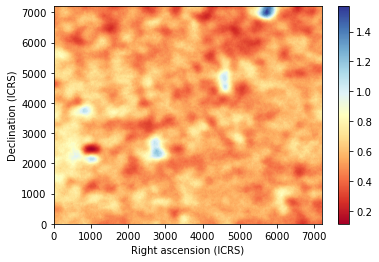

2022-08-13 15:28:08,063 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:08,066 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.12 [MHz] ...
2022-08-13 15:28:08,814 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:14,164 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 15:28:14,451 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.12.fits']


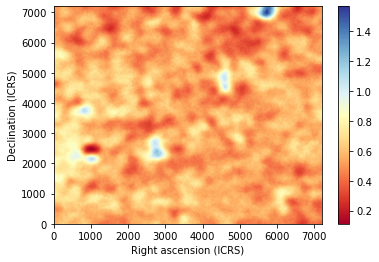

2022-08-13 15:28:16,371 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:16,374 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.28 [MHz] ...
2022-08-13 15:28:17,120 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:22,474 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 15:28:22,805 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.28.fits']


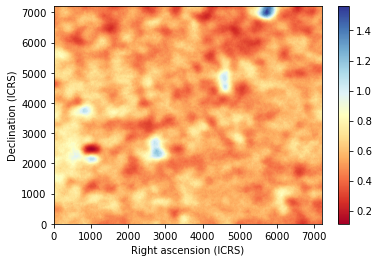

2022-08-13 15:28:24,725 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:24,728 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.44 [MHz] ...
2022-08-13 15:28:25,477 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:30,828 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 15:28:31,115 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.44.fits']


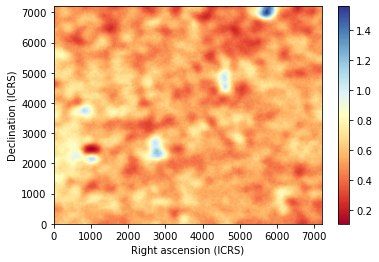

2022-08-13 15:28:33,039 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:33,042 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.60 [MHz] ...
2022-08-13 15:28:33,793 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:39,137 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 15:28:39,423 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.60.fits']


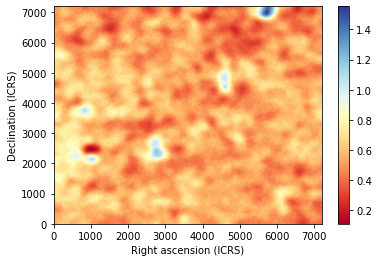

2022-08-13 15:28:41,343 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:41,345 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.76 [MHz] ...
2022-08-13 15:28:42,099 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:47,455 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 15:28:47,744 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.76.fits']


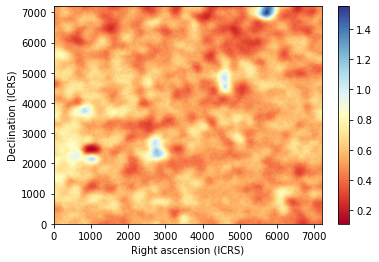

2022-08-13 15:28:49,666 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:49,669 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.92 [MHz] ...
2022-08-13 15:28:50,422 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:28:55,972 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 15:28:56,260 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_125.92.fits']


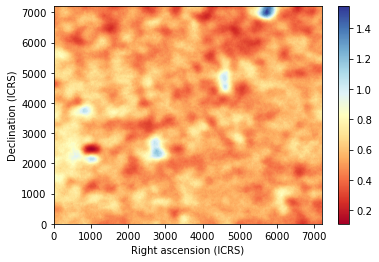

2022-08-13 15:28:58,189 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:28:58,192 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.08 [MHz] ...
2022-08-13 15:28:58,947 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:04,713 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 15:29:05,000 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.08.fits']


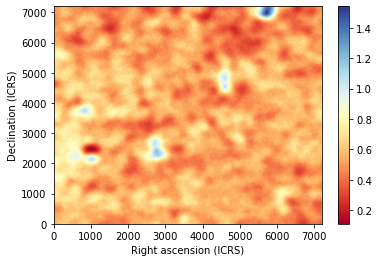

2022-08-13 15:29:06,915 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:06,918 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.24 [MHz] ...
2022-08-13 15:29:07,667 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:13,429 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 15:29:13,719 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.24.fits']


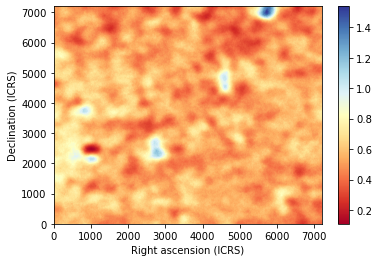

2022-08-13 15:29:15,644 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:15,647 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.40 [MHz] ...
2022-08-13 15:29:16,396 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:22,164 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 15:29:22,454 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.40.fits']


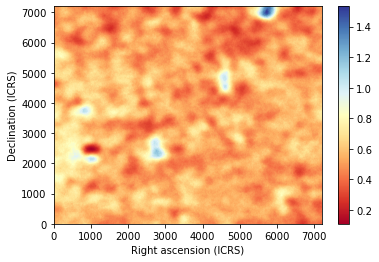

2022-08-13 15:29:24,369 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:24,372 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.56 [MHz] ...
2022-08-13 15:29:25,130 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:30,888 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 15:29:31,178 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.56.fits']


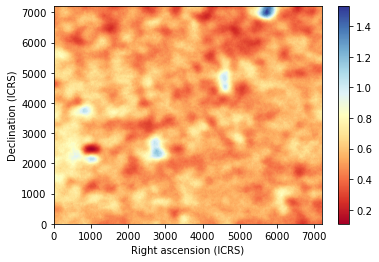

2022-08-13 15:29:33,087 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:33,090 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.72 [MHz] ...
2022-08-13 15:29:33,838 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:39,551 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 15:29:39,839 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.72.fits']


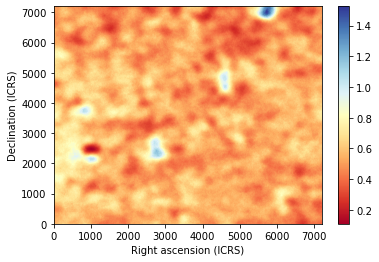

2022-08-13 15:29:42,267 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:42,270 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.88 [MHz] ...
2022-08-13 15:29:43,014 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:48,362 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 15:29:48,652 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_126.88.fits']


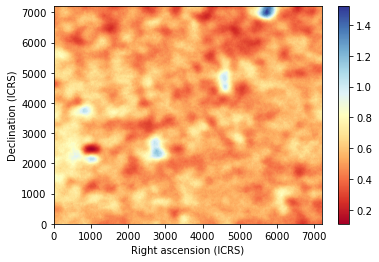

2022-08-13 15:29:50,570 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:50,573 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.04 [MHz] ...
2022-08-13 15:29:51,318 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:29:56,674 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 15:29:56,963 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.04.fits']


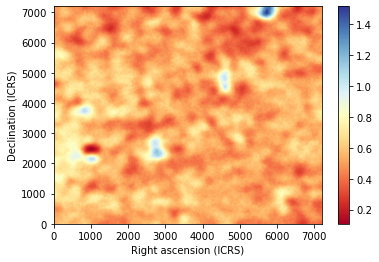

2022-08-13 15:29:58,885 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:29:58,888 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.20 [MHz] ...
2022-08-13 15:29:59,638 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:04,999 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 15:30:05,290 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.20.fits']


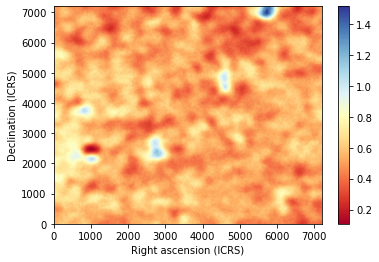

2022-08-13 15:30:07,213 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:07,216 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.36 [MHz] ...
2022-08-13 15:30:07,972 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:13,315 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 15:30:13,606 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.36.fits']


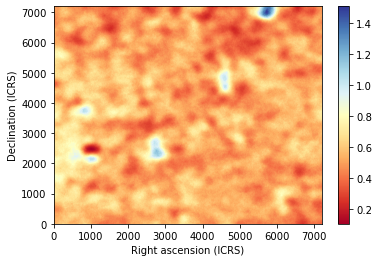

2022-08-13 15:30:15,527 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:15,530 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.52 [MHz] ...
2022-08-13 15:30:16,284 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:21,618 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 15:30:21,907 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.52.fits']


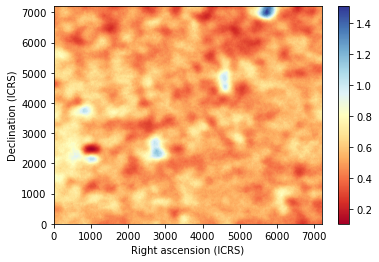

2022-08-13 15:30:23,826 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:23,829 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.68 [MHz] ...
2022-08-13 15:30:24,580 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:30,076 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 15:30:30,364 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.68.fits']


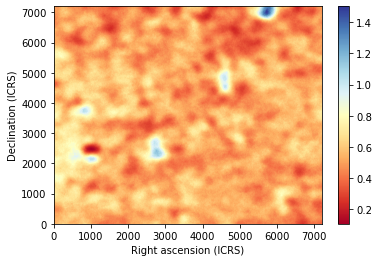

2022-08-13 15:30:32,277 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:32,280 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.84 [MHz] ...
2022-08-13 15:30:33,031 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:38,688 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 15:30:38,976 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_127.84.fits']


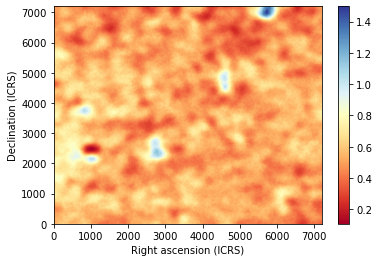

2022-08-13 15:30:40,893 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:40,895 : simulate_frequency : INFO : Simulating Galactic free-free map at 128.00 [MHz] ...
2022-08-13 15:30:41,646 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:47,303 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 15:30:47,591 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_44-23_128.00.fits']


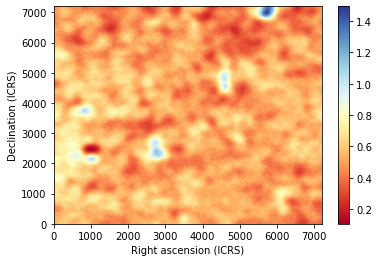

In [30]:
do_simulation(S.freqs['low']['f'], S, s_outlow)

##### Mid band

2022-08-13 15:30:49,524 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:49,528 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.00 [MHz] ...
2022-08-13 15:30:50,275 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:30:55,926 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 15:30:56,214 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.00.fits']


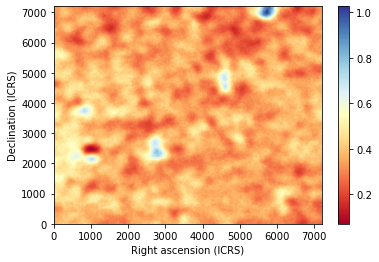

2022-08-13 15:30:58,116 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:30:58,119 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.16 [MHz] ...
2022-08-13 15:30:58,868 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:04,505 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 15:31:04,792 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.16.fits']


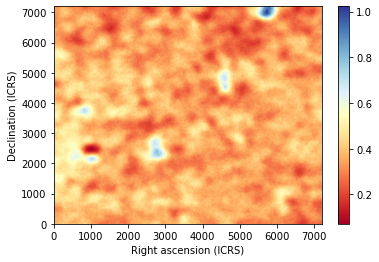

2022-08-13 15:31:06,700 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:06,703 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.32 [MHz] ...
2022-08-13 15:31:07,453 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:13,098 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 15:31:13,385 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.32.fits']


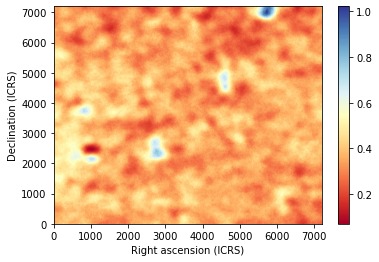

2022-08-13 15:31:15,807 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:15,809 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.48 [MHz] ...
2022-08-13 15:31:16,557 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:21,936 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 15:31:22,226 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.48.fits']


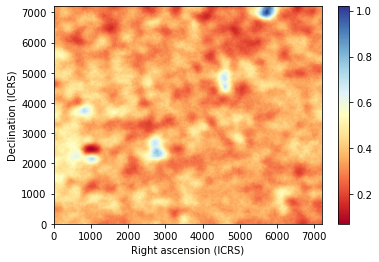

2022-08-13 15:31:24,133 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:24,136 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.64 [MHz] ...
2022-08-13 15:31:24,881 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:30,211 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 15:31:30,499 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.64.fits']


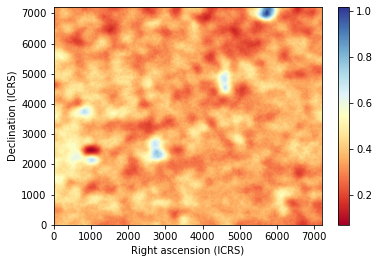

2022-08-13 15:31:32,409 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:32,412 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.80 [MHz] ...
2022-08-13 15:31:33,168 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:38,489 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 15:31:38,778 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.80.fits']


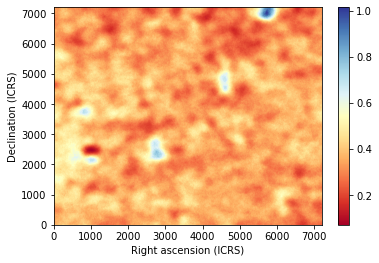

2022-08-13 15:31:40,690 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:40,693 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.96 [MHz] ...
2022-08-13 15:31:41,444 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:46,757 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 15:31:47,045 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_154.96.fits']


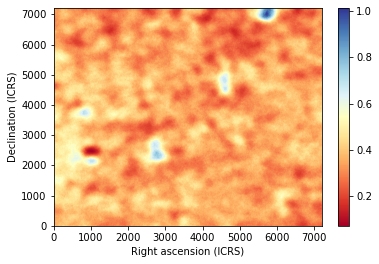

2022-08-13 15:31:48,957 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:48,959 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.12 [MHz] ...
2022-08-13 15:31:49,716 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:31:55,030 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 15:31:55,317 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.12.fits']


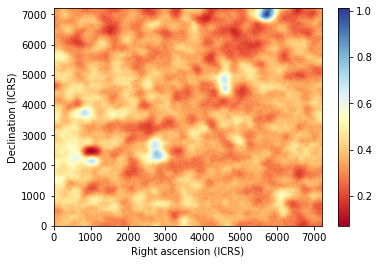

2022-08-13 15:31:57,226 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:31:57,229 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.28 [MHz] ...
2022-08-13 15:31:57,976 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:03,467 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 15:32:03,756 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.28.fits']


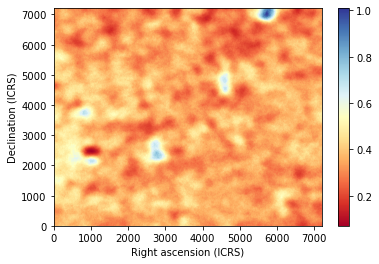

2022-08-13 15:32:05,671 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:05,674 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.44 [MHz] ...
2022-08-13 15:32:06,421 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:12,064 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 15:32:12,353 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.44.fits']


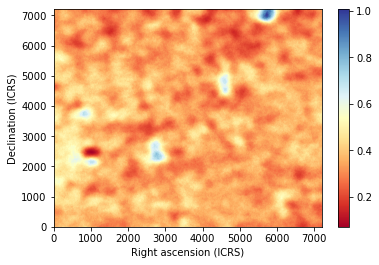

2022-08-13 15:32:14,268 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:14,271 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.60 [MHz] ...
2022-08-13 15:32:15,018 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:20,668 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 15:32:20,960 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.60.fits']


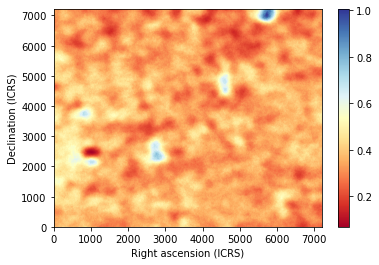

2022-08-13 15:32:22,878 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:22,881 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.76 [MHz] ...
2022-08-13 15:32:23,627 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:29,277 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 15:32:29,566 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.76.fits']


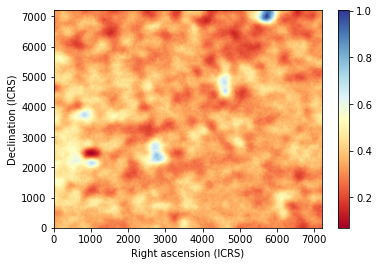

2022-08-13 15:32:31,473 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:31,476 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.92 [MHz] ...
2022-08-13 15:32:32,229 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:37,876 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 15:32:38,165 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_155.92.fits']


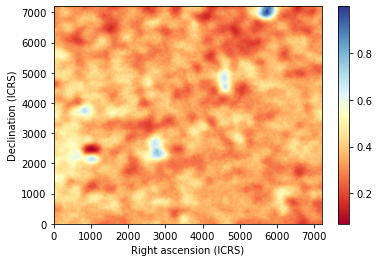

2022-08-13 15:32:40,069 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:40,072 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.08 [MHz] ...
2022-08-13 15:32:40,823 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:46,462 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 15:32:46,751 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.08.fits']


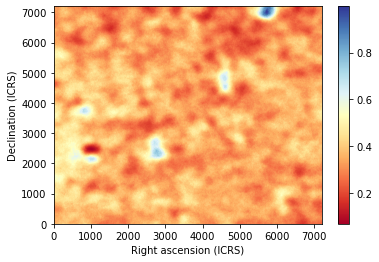

2022-08-13 15:32:49,166 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:49,169 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.24 [MHz] ...
2022-08-13 15:32:49,921 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:32:55,255 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 15:32:55,545 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.24.fits']


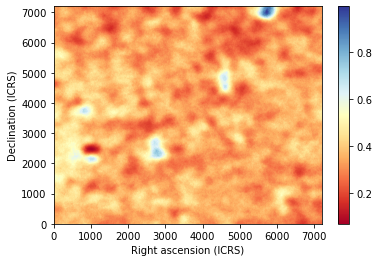

2022-08-13 15:32:57,452 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:32:57,455 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.40 [MHz] ...
2022-08-13 15:32:58,204 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:03,536 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 15:33:03,825 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.40.fits']


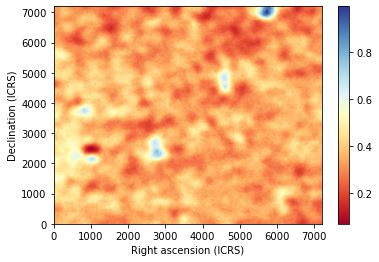

2022-08-13 15:33:05,730 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:05,733 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.56 [MHz] ...
2022-08-13 15:33:06,481 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:11,801 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 15:33:12,091 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.56.fits']


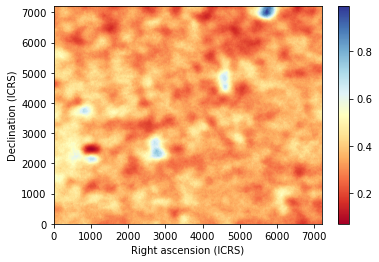

2022-08-13 15:33:13,998 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:14,001 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.72 [MHz] ...
2022-08-13 15:33:14,752 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:20,086 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 15:33:20,375 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.72.fits']


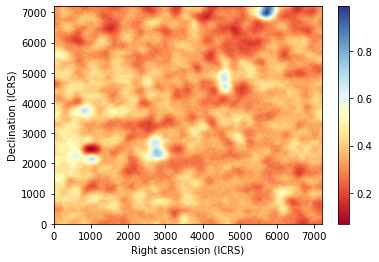

2022-08-13 15:33:22,288 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:22,290 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.88 [MHz] ...
2022-08-13 15:33:23,036 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:28,362 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 15:33:28,650 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_156.88.fits']


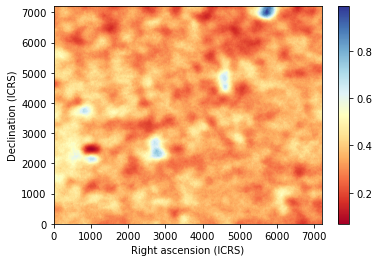

2022-08-13 15:33:30,548 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:30,550 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.04 [MHz] ...
2022-08-13 15:33:31,313 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:36,792 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 15:33:37,083 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.04.fits']


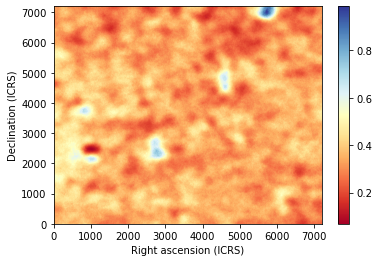

2022-08-13 15:33:38,987 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:38,990 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.20 [MHz] ...
2022-08-13 15:33:39,741 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:45,373 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 15:33:45,662 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.20.fits']


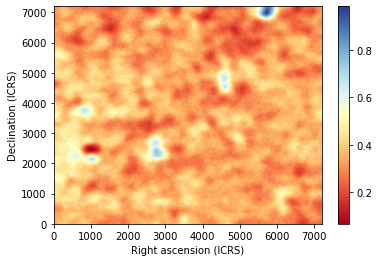

2022-08-13 15:33:47,563 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:47,566 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.36 [MHz] ...
2022-08-13 15:33:48,314 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:33:53,955 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 15:33:54,245 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.36.fits']


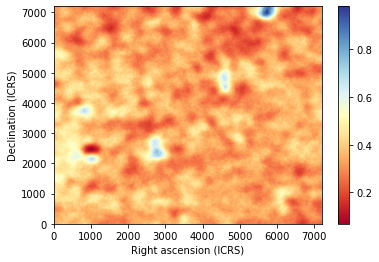

2022-08-13 15:33:56,149 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:33:56,152 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.52 [MHz] ...
2022-08-13 15:33:56,904 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:02,596 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 15:34:02,884 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.52.fits']


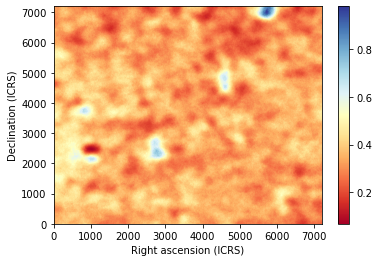

2022-08-13 15:34:04,780 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:04,782 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.68 [MHz] ...
2022-08-13 15:34:05,533 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:11,168 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 15:34:11,457 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.68.fits']


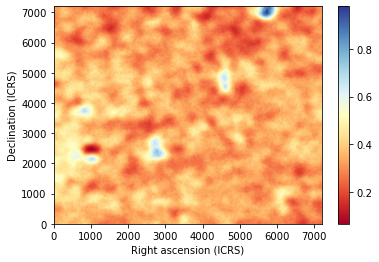

2022-08-13 15:34:13,358 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:13,361 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.84 [MHz] ...
2022-08-13 15:34:14,107 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:19,668 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 15:34:19,954 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_157.84.fits']


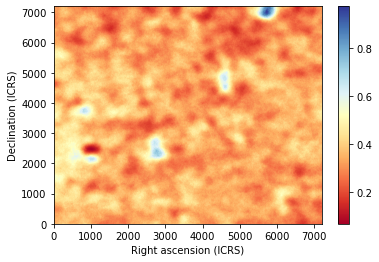

2022-08-13 15:34:22,378 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:22,381 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 15:34:23,129 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:28,448 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 15:34:28,735 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.00.fits']


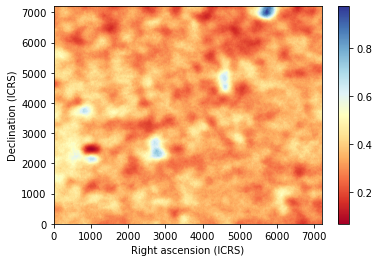

2022-08-13 15:34:30,637 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:30,639 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.16 [MHz] ...
2022-08-13 15:34:31,385 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:36,715 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 15:34:37,006 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.16.fits']


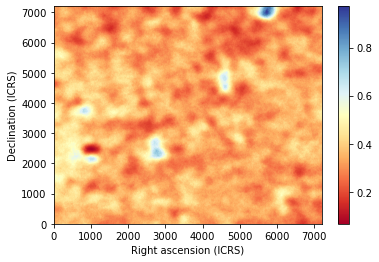

2022-08-13 15:34:38,918 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:38,920 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.32 [MHz] ...
2022-08-13 15:34:39,665 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:44,997 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 15:34:45,284 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.32.fits']


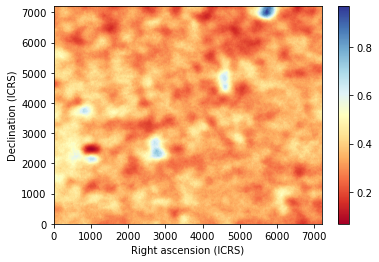

2022-08-13 15:34:47,184 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:47,187 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.48 [MHz] ...
2022-08-13 15:34:47,938 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:34:53,270 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 15:34:53,558 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.48.fits']


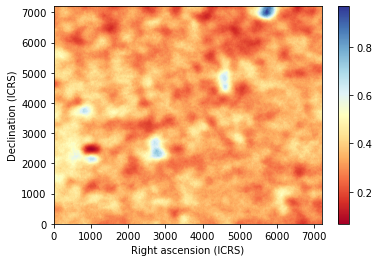

2022-08-13 15:34:55,457 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:34:55,459 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.64 [MHz] ...
2022-08-13 15:34:56,206 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:01,517 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 15:35:01,803 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.64.fits']


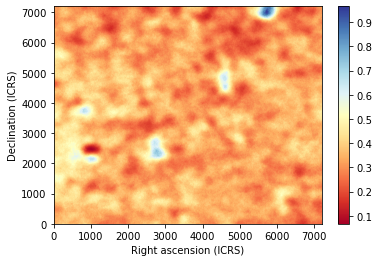

2022-08-13 15:35:03,725 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:03,727 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.80 [MHz] ...
2022-08-13 15:35:04,475 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:09,789 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 15:35:10,077 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.80.fits']


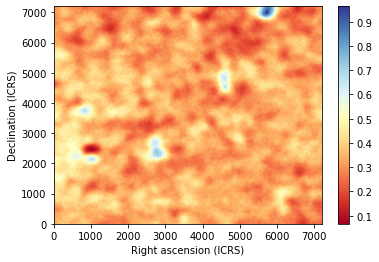

2022-08-13 15:35:12,004 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:12,006 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.96 [MHz] ...
2022-08-13 15:35:12,749 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:18,068 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 15:35:18,353 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_158.96.fits']


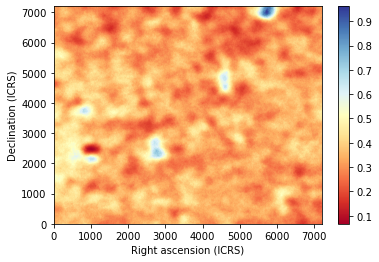

2022-08-13 15:35:20,284 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:20,286 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.12 [MHz] ...
2022-08-13 15:35:21,033 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:26,348 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 15:35:26,635 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.12.fits']


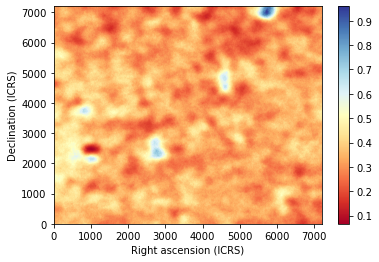

2022-08-13 15:35:28,561 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:28,563 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.28 [MHz] ...
2022-08-13 15:35:29,313 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:34,625 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 15:35:34,913 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.28.fits']


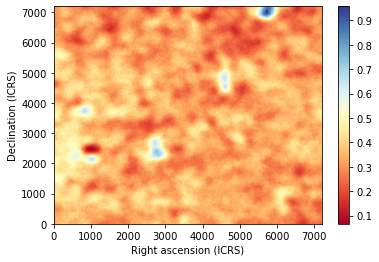

2022-08-13 15:35:36,835 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:36,837 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.44 [MHz] ...
2022-08-13 15:35:37,584 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:42,908 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 15:35:43,195 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.44.fits']


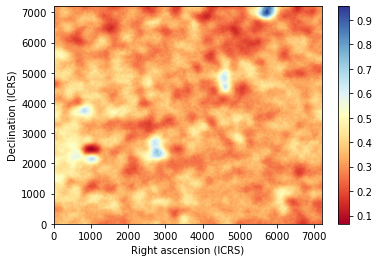

2022-08-13 15:35:45,120 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:45,122 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.60 [MHz] ...
2022-08-13 15:35:45,869 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:51,186 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 15:35:51,473 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.60.fits']


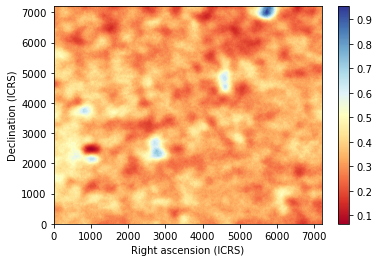

2022-08-13 15:35:53,909 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:35:53,911 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.76 [MHz] ...
2022-08-13 15:35:54,655 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:35:59,964 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 15:36:00,251 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.76.fits']


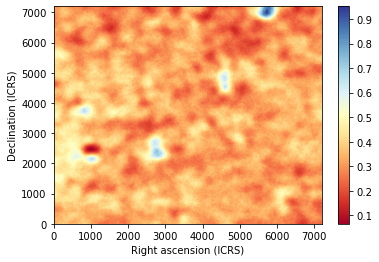

2022-08-13 15:36:02,175 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:02,177 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.92 [MHz] ...
2022-08-13 15:36:02,924 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:08,242 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 15:36:08,530 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_159.92.fits']


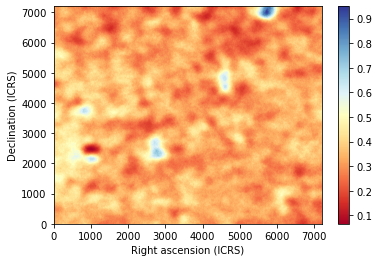

2022-08-13 15:36:10,449 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:10,451 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.08 [MHz] ...
2022-08-13 15:36:11,197 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:16,514 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 15:36:16,800 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.08.fits']


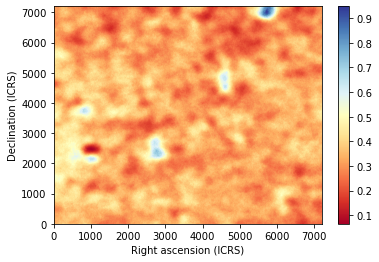

2022-08-13 15:36:18,725 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:18,727 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.24 [MHz] ...
2022-08-13 15:36:19,470 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:24,789 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 15:36:25,073 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.24.fits']


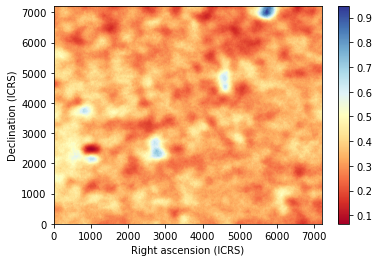

2022-08-13 15:36:27,001 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:27,003 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.40 [MHz] ...
2022-08-13 15:36:27,746 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:33,067 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 15:36:33,354 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.40.fits']


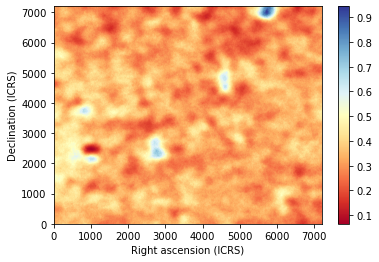

2022-08-13 15:36:35,283 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:35,285 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.56 [MHz] ...
2022-08-13 15:36:36,031 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:41,341 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 15:36:41,629 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.56.fits']


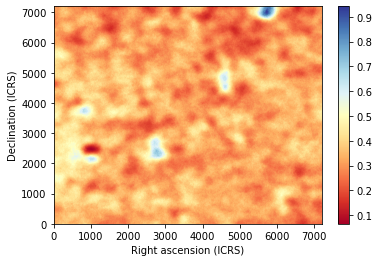

2022-08-13 15:36:43,553 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:43,555 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.72 [MHz] ...
2022-08-13 15:36:44,299 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:49,618 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 15:36:49,905 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.72.fits']


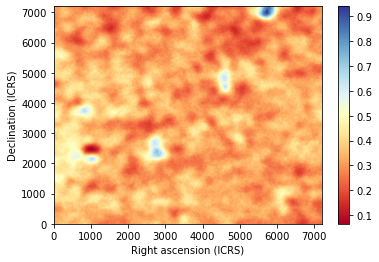

2022-08-13 15:36:51,829 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:36:51,831 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.88 [MHz] ...
2022-08-13 15:36:52,574 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:36:57,896 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 15:36:58,183 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_160.88.fits']


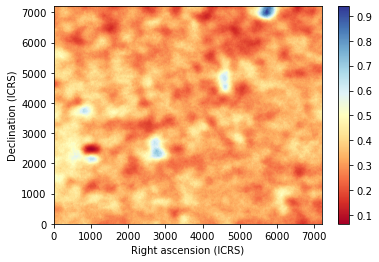

2022-08-13 15:37:00,107 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:00,109 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.04 [MHz] ...
2022-08-13 15:37:00,852 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:06,171 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 15:37:06,460 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.04.fits']


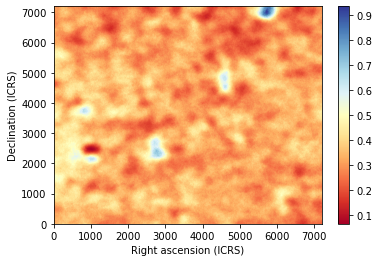

2022-08-13 15:37:08,383 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:08,385 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.20 [MHz] ...
2022-08-13 15:37:09,129 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:14,451 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 15:37:14,740 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.20.fits']


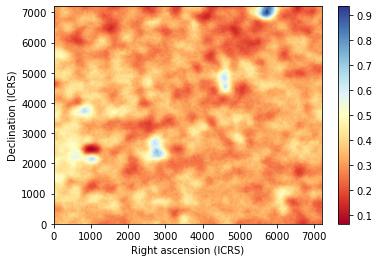

2022-08-13 15:37:16,666 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:16,667 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.36 [MHz] ...
2022-08-13 15:37:17,416 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:22,738 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 15:37:23,026 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.36.fits']


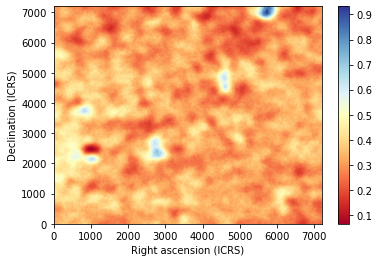

2022-08-13 15:37:25,465 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:25,467 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.52 [MHz] ...
2022-08-13 15:37:26,211 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:31,525 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 15:37:31,813 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.52.fits']


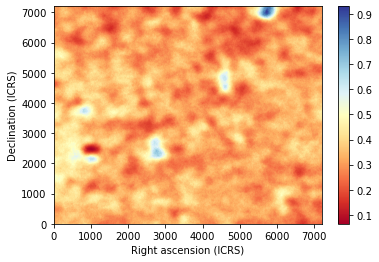

2022-08-13 15:37:33,735 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:33,737 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.68 [MHz] ...
2022-08-13 15:37:34,480 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:39,799 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 15:37:40,086 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.68.fits']


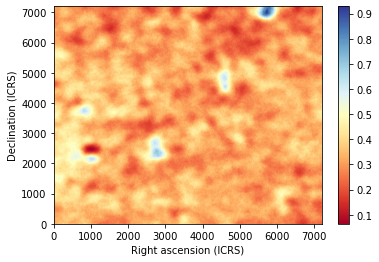

2022-08-13 15:37:42,012 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:42,015 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.84 [MHz] ...
2022-08-13 15:37:42,763 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:48,075 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 15:37:48,361 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_161.84.fits']


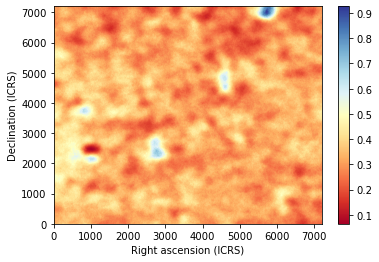

2022-08-13 15:37:50,289 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:50,291 : simulate_frequency : INFO : Simulating Galactic free-free map at 162.00 [MHz] ...
2022-08-13 15:37:51,038 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:37:56,350 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 15:37:56,637 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_44-23_162.00.fits']


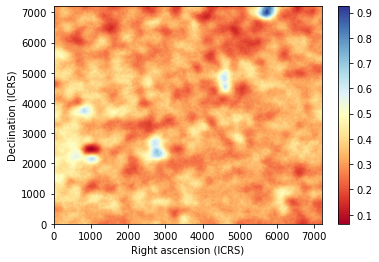

In [31]:
do_simulation(S.freqs['mid']['f'], S, s_outmid)

##### hig band

2022-08-13 15:37:58,580 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:37:58,583 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.00 [MHz] ...
2022-08-13 15:37:59,328 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:04,644 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 15:38:04,938 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.00.fits']


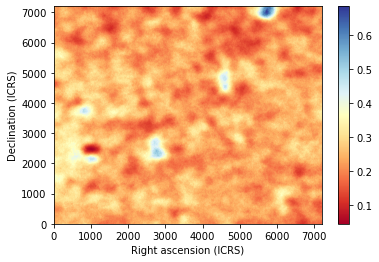

2022-08-13 15:38:06,841 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:06,843 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.16 [MHz] ...
2022-08-13 15:38:07,587 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:12,899 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 15:38:13,185 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.16.fits']


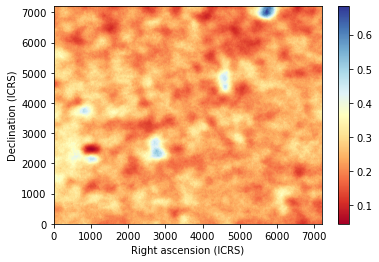

2022-08-13 15:38:15,095 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:15,097 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.32 [MHz] ...
2022-08-13 15:38:15,839 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:21,154 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 15:38:21,440 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.32.fits']


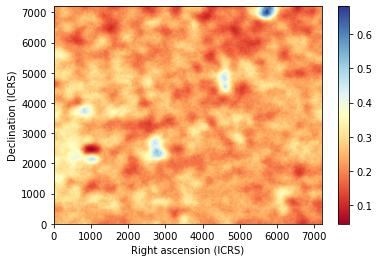

2022-08-13 15:38:23,348 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:23,350 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.48 [MHz] ...
2022-08-13 15:38:24,094 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:29,408 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 15:38:29,721 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.48.fits']


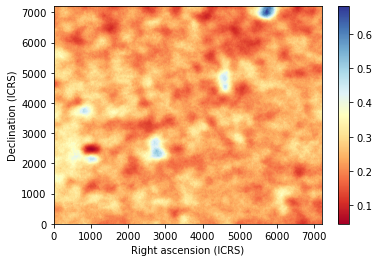

2022-08-13 15:38:31,628 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:31,630 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.64 [MHz] ...
2022-08-13 15:38:32,374 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:37,935 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 15:38:38,235 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.64.fits']


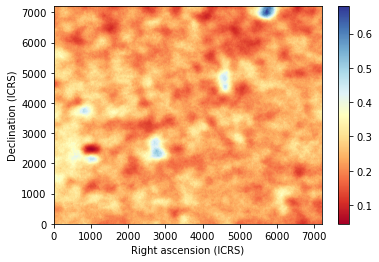

2022-08-13 15:38:40,143 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:40,145 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.80 [MHz] ...
2022-08-13 15:38:40,893 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:46,481 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 15:38:46,779 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.80.fits']


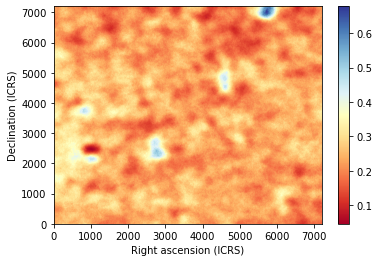

2022-08-13 15:38:48,685 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:48,687 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.96 [MHz] ...
2022-08-13 15:38:49,430 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:38:55,062 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 15:38:55,350 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_188.96.fits']


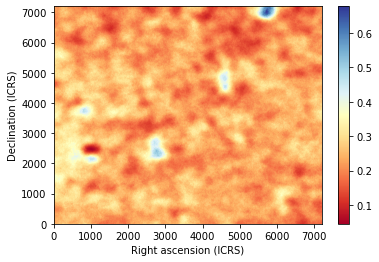

2022-08-13 15:38:57,771 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:38:57,773 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.12 [MHz] ...
2022-08-13 15:38:58,514 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:03,835 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 15:39:04,122 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.12.fits']


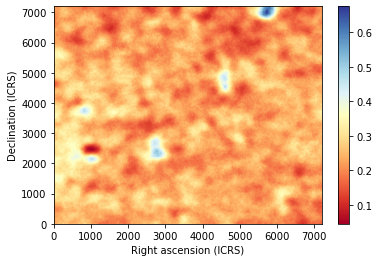

2022-08-13 15:39:06,028 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:06,030 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.28 [MHz] ...
2022-08-13 15:39:06,773 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:12,093 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 15:39:12,420 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.28.fits']


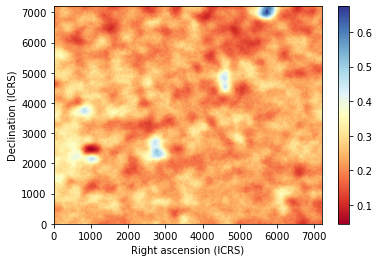

2022-08-13 15:39:14,335 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:14,337 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.44 [MHz] ...
2022-08-13 15:39:15,083 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:20,395 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 15:39:20,681 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.44.fits']


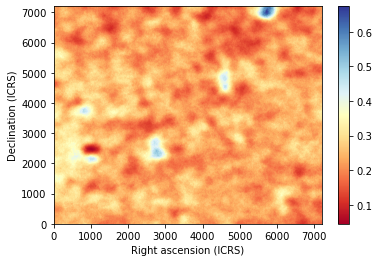

2022-08-13 15:39:22,596 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:22,598 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.60 [MHz] ...
2022-08-13 15:39:23,344 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:28,662 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 15:39:29,025 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.60.fits']


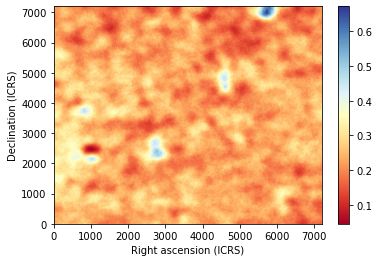

2022-08-13 15:39:30,944 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:30,946 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.76 [MHz] ...
2022-08-13 15:39:31,695 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:37,007 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 15:39:37,293 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.76.fits']


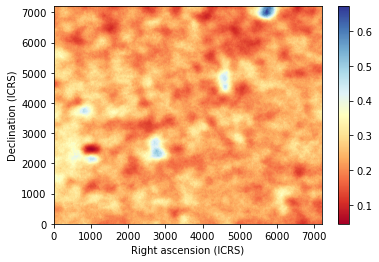

2022-08-13 15:39:39,205 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:39,207 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.92 [MHz] ...
2022-08-13 15:39:39,954 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:45,417 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 15:39:45,706 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_189.92.fits']


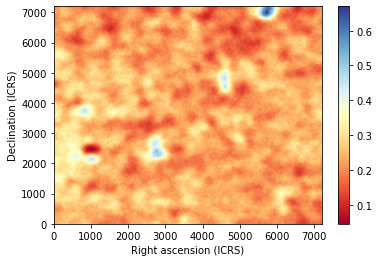

2022-08-13 15:39:47,621 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:47,623 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.08 [MHz] ...
2022-08-13 15:39:48,369 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:39:53,995 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 15:39:54,281 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.08.fits']


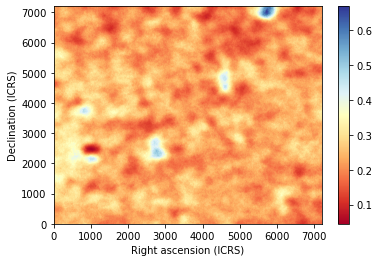

2022-08-13 15:39:56,189 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:39:56,191 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.24 [MHz] ...
2022-08-13 15:39:56,938 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:02,465 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 15:40:02,791 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.24.fits']


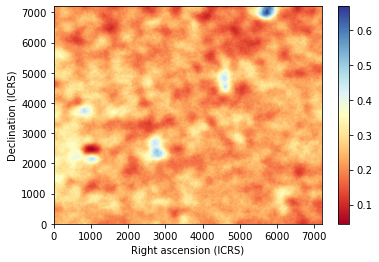

2022-08-13 15:40:04,700 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:04,702 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.40 [MHz] ...
2022-08-13 15:40:05,445 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:11,070 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 15:40:11,354 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.40.fits']


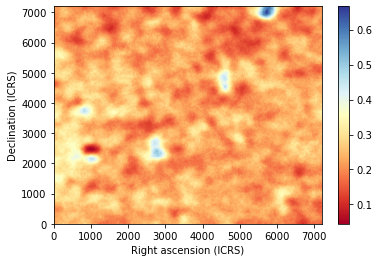

2022-08-13 15:40:13,260 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:13,262 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.56 [MHz] ...
2022-08-13 15:40:14,004 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:19,623 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 15:40:19,909 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.56.fits']


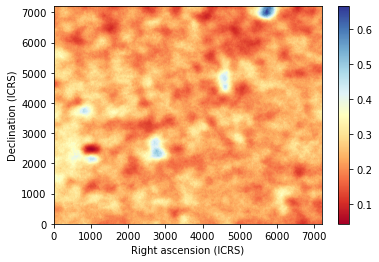

2022-08-13 15:40:21,811 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:21,813 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.72 [MHz] ...
2022-08-13 15:40:22,554 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:28,170 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 15:40:28,454 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.72.fits']


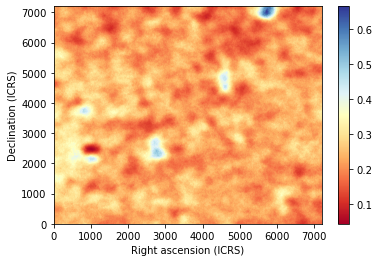

2022-08-13 15:40:30,863 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:30,865 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.88 [MHz] ...
2022-08-13 15:40:31,603 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:36,910 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 15:40:37,197 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_190.88.fits']


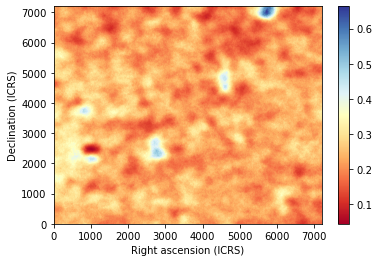

2022-08-13 15:40:39,105 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:39,107 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.04 [MHz] ...
2022-08-13 15:40:39,849 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:45,156 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 15:40:45,443 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.04.fits']


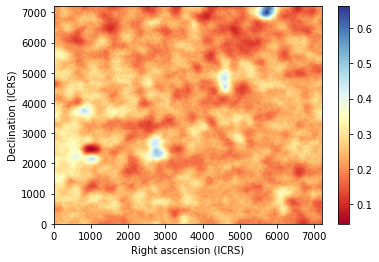

2022-08-13 15:40:47,356 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:47,358 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.20 [MHz] ...
2022-08-13 15:40:48,100 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:40:53,402 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 15:40:53,688 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.20.fits']


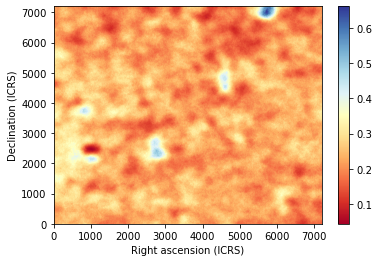

2022-08-13 15:40:55,592 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:40:55,594 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.36 [MHz] ...
2022-08-13 15:40:56,336 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:01,641 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 15:41:01,927 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.36.fits']


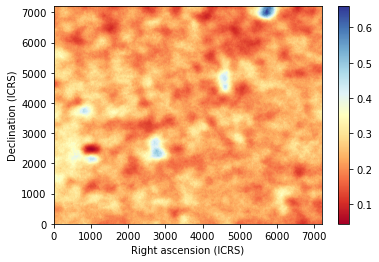

2022-08-13 15:41:03,838 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:03,840 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.52 [MHz] ...
2022-08-13 15:41:04,582 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:09,883 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 15:41:10,168 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.52.fits']


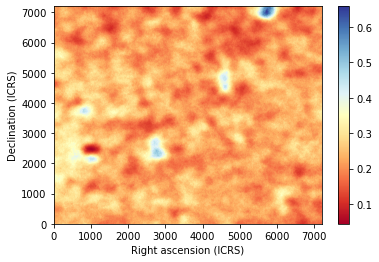

2022-08-13 15:41:12,078 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:12,080 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.68 [MHz] ...
2022-08-13 15:41:12,821 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:18,282 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 15:41:18,568 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.68.fits']


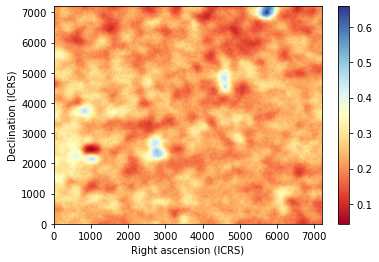

2022-08-13 15:41:20,478 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:20,480 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.84 [MHz] ...
2022-08-13 15:41:21,222 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:26,843 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 15:41:27,131 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_191.84.fits']


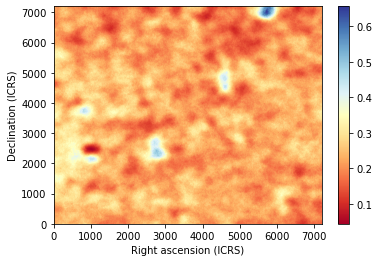

2022-08-13 15:41:29,038 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:29,040 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.00 [MHz] ...
2022-08-13 15:41:29,781 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:35,373 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 15:41:35,660 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.00.fits']


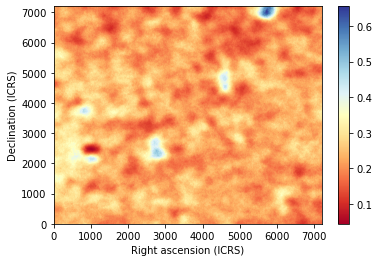

2022-08-13 15:41:37,567 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:37,569 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.16 [MHz] ...
2022-08-13 15:41:38,310 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:43,932 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 15:41:44,219 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.16.fits']


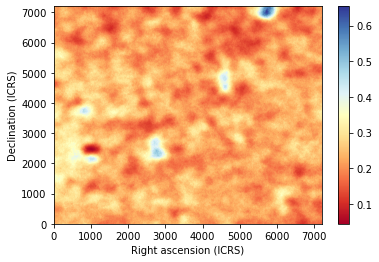

2022-08-13 15:41:46,122 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:46,124 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.32 [MHz] ...
2022-08-13 15:41:46,865 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:41:52,476 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 15:41:52,759 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.32.fits']


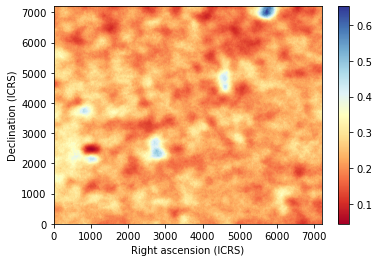

2022-08-13 15:41:54,662 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:41:54,664 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.48 [MHz] ...
2022-08-13 15:41:55,405 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:00,890 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 15:42:01,212 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.48.fits']


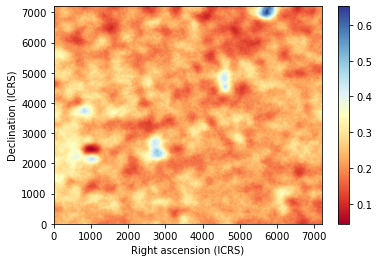

2022-08-13 15:42:03,618 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:03,620 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.64 [MHz] ...
2022-08-13 15:42:04,358 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:09,658 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 15:42:09,942 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.64.fits']


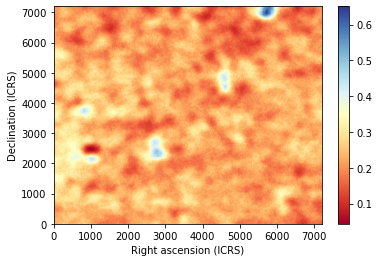

2022-08-13 15:42:11,846 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:11,848 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.80 [MHz] ...
2022-08-13 15:42:12,589 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:17,886 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 15:42:18,169 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.80.fits']


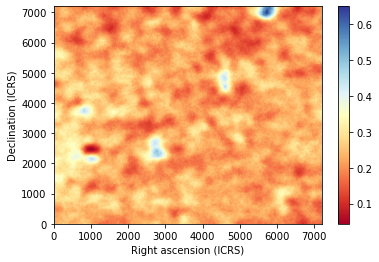

2022-08-13 15:42:20,071 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:20,073 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.96 [MHz] ...
2022-08-13 15:42:20,815 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:26,113 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 15:42:26,413 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_192.96.fits']


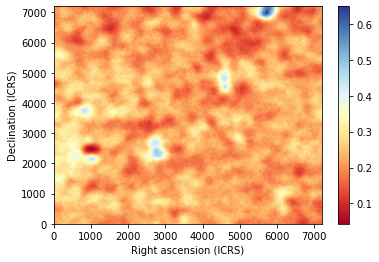

2022-08-13 15:42:28,320 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:28,322 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.12 [MHz] ...
2022-08-13 15:42:29,063 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:34,359 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 15:42:34,641 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.12.fits']


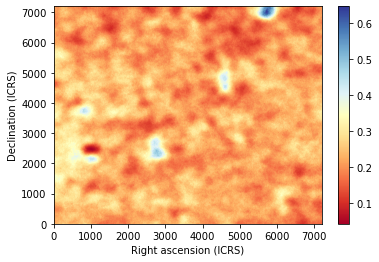

2022-08-13 15:42:36,553 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:36,556 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.28 [MHz] ...
2022-08-13 15:42:37,297 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:42,592 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 15:42:42,875 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.28.fits']


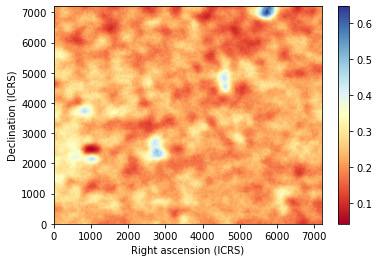

2022-08-13 15:42:44,778 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:44,780 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.44 [MHz] ...
2022-08-13 15:42:45,521 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:50,906 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 15:42:51,189 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.44.fits']


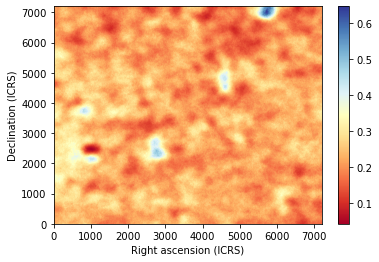

2022-08-13 15:42:53,100 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:42:53,102 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.60 [MHz] ...
2022-08-13 15:42:53,844 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:42:59,293 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 15:42:59,578 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.60.fits']


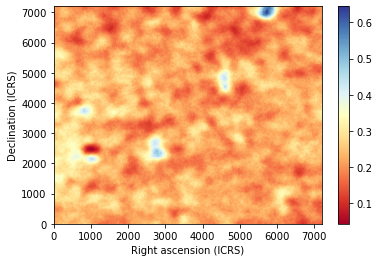

2022-08-13 15:43:01,482 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:01,484 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.76 [MHz] ...
2022-08-13 15:43:02,225 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:07,675 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 15:43:07,959 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.76.fits']


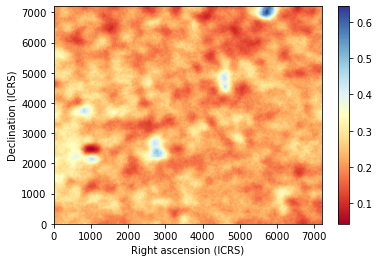

2022-08-13 15:43:09,870 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:09,872 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.92 [MHz] ...
2022-08-13 15:43:10,613 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:16,066 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 15:43:16,347 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_193.92.fits']


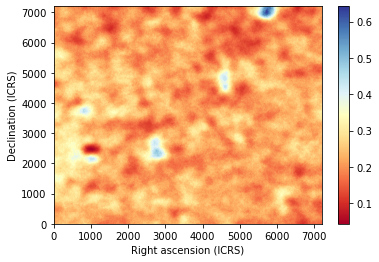

2022-08-13 15:43:18,244 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:18,246 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.08 [MHz] ...
2022-08-13 15:43:18,987 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:24,439 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 15:43:24,720 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.08.fits']


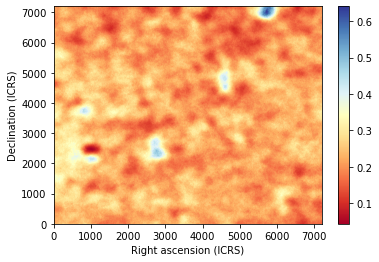

2022-08-13 15:43:26,617 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:26,619 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.24 [MHz] ...
2022-08-13 15:43:27,361 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:32,813 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 15:43:33,094 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.24.fits']


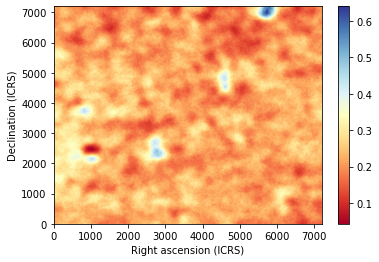

2022-08-13 15:43:35,502 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:35,504 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.40 [MHz] ...
2022-08-13 15:43:36,243 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:41,541 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 15:43:41,826 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.40.fits']


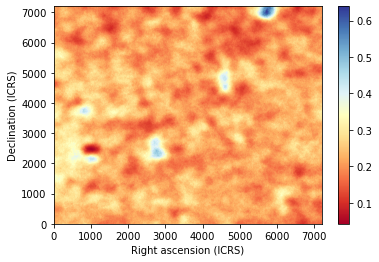

2022-08-13 15:43:43,727 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:43,729 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.56 [MHz] ...
2022-08-13 15:43:44,471 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:49,765 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 15:43:50,047 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.56.fits']


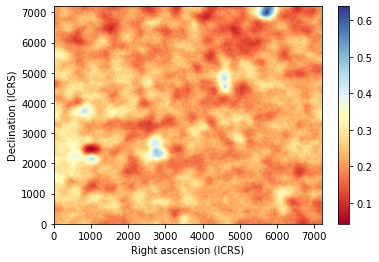

2022-08-13 15:43:51,957 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:43:51,959 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.72 [MHz] ...
2022-08-13 15:43:52,701 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:43:57,994 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 15:43:58,278 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.72.fits']


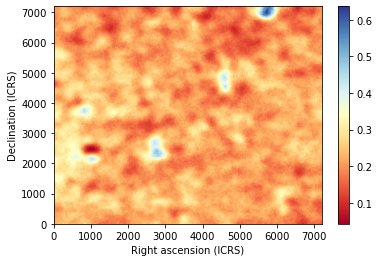

2022-08-13 15:44:00,190 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:00,192 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.88 [MHz] ...
2022-08-13 15:44:00,933 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:06,224 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 15:44:06,506 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_194.88.fits']


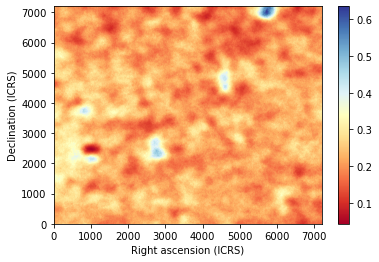

2022-08-13 15:44:08,421 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:08,423 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.04 [MHz] ...
2022-08-13 15:44:09,165 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:14,456 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 15:44:14,738 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.04.fits']


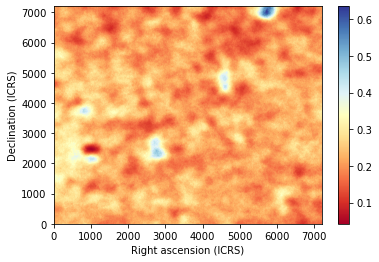

2022-08-13 15:44:16,640 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:16,642 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.20 [MHz] ...
2022-08-13 15:44:17,383 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:22,766 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 15:44:23,050 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.20.fits']


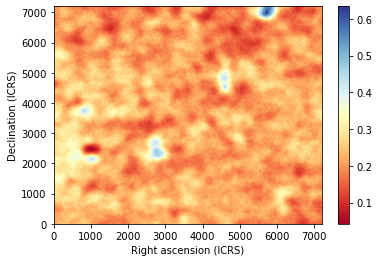

2022-08-13 15:44:24,950 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:24,952 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.36 [MHz] ...
2022-08-13 15:44:25,693 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:31,142 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 15:44:31,423 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.36.fits']


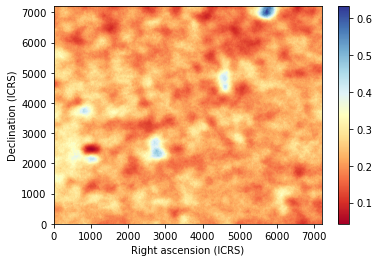

2022-08-13 15:44:33,325 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:33,327 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.52 [MHz] ...
2022-08-13 15:44:34,068 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:39,525 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 15:44:39,809 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.52.fits']


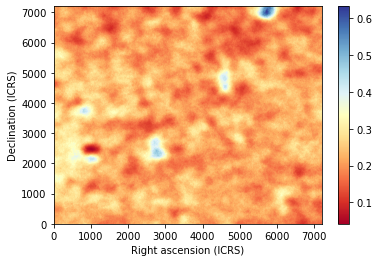

2022-08-13 15:44:41,712 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:41,714 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.68 [MHz] ...
2022-08-13 15:44:42,454 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:47,910 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 15:44:48,192 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.68.fits']


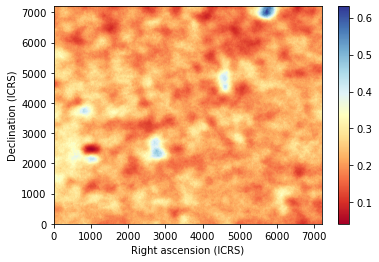

2022-08-13 15:44:50,096 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:50,098 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.84 [MHz] ...
2022-08-13 15:44:50,840 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:44:56,291 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 15:44:56,573 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_195.84.fits']


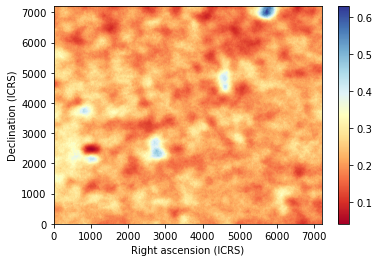

2022-08-13 15:44:58,474 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 15:44:58,476 : simulate_frequency : INFO : Simulating Galactic free-free map at 196.00 [MHz] ...
2022-08-13 15:44:59,217 : add_ss : INFO : The small scale map is generated using alpha=0.028225957060665583, beta=0.5723354608928948.
2022-08-13 15:45:04,674 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 15:45:04,958 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_44-23_196.00.fits']


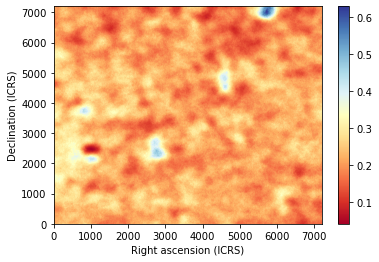

In [32]:
do_simulation(S.freqs['hig']['f'], S, s_outhig)